**Problem Statement:**

**This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.**

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pandas as pd
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings("ignore")
import seaborn as sn
import numpy as np
import scipy.stats as stats
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR,NuSVR,LinearSVR
from sklearn.linear_model import LinearRegression,Ridge,RidgeCV,BayesianRidge,SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.svm import NuSVR
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor,XGBRFRegressor
from sklearn.feature_selection import SelectKBest,chi2
import random
import joblib
%matplotlib inline

##### Uploading the dataset

In [2]:
df=pd.read_csv('temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


##### Independent variables
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9

Target variable
1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature

In [3]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [4]:
print('Number of rows x columns in dataset are:',df.shape)

Number of rows x columns in dataset are: (7752, 25)


In [5]:
print('Dataset contains any null values:',df.isnull().values.any())

Dataset contains any null values: True


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


##### All variable are of numeric type except Date.

In [7]:
df[df.Date.isnull()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [8]:
df.Date.value_counts()

13-07-2016    25
10-08-2013    25
04-08-2013    25
16-07-2014    25
17-08-2016    25
              ..
18-07-2013    25
14-08-2015    25
27-07-2014    25
09-07-2016    25
25-08-2013    25
Name: Date, Length: 310, dtype: int64

##### Drop 2 rows with NaN values

In [9]:
df=df[df.Date.notnull()]

#### Converting Date into month

In [10]:
for i in range(len(df['Date'])):
    df['Date'][i]=int(df['Date'][i].split('-')[1])
df = df.astype({'Date': np.int64})

In [11]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,6,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,6,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,6,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,6,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,6,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,8,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,8,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,8,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,8,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


#### target variable has null values, for now drop those rows we will fill those rows once model is built and by using predict method

In [12]:
df_new=df[df.Next_Tmax.notnull()][df.Next_Tmin.notnull()]

In [13]:
df_new[df_new.Next_Tmax.isnull()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin


In [14]:
df_new[df_new.Next_Tmin.isnull()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin


In [15]:
print('Number of rows x columns in dataset are:',df_new.shape)

Number of rows x columns in dataset are: (7723, 25)


In [16]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7723 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7723 non-null   float64
 1   Date              7723 non-null   int64  
 2   Present_Tmax      7663 non-null   float64
 3   Present_Tmin      7663 non-null   float64
 4   LDAPS_RHmin       7648 non-null   float64
 5   LDAPS_RHmax       7648 non-null   float64
 6   LDAPS_Tmax_lapse  7648 non-null   float64
 7   LDAPS_Tmin_lapse  7648 non-null   float64
 8   LDAPS_WS          7648 non-null   float64
 9   LDAPS_LH          7648 non-null   float64
 10  LDAPS_CC1         7648 non-null   float64
 11  LDAPS_CC2         7648 non-null   float64
 12  LDAPS_CC3         7648 non-null   float64
 13  LDAPS_CC4         7648 non-null   float64
 14  LDAPS_PPT1        7648 non-null   float64
 15  LDAPS_PPT2        7648 non-null   float64
 16  LDAPS_PPT3        7648 non-null   float64


#### Distrribution Plots

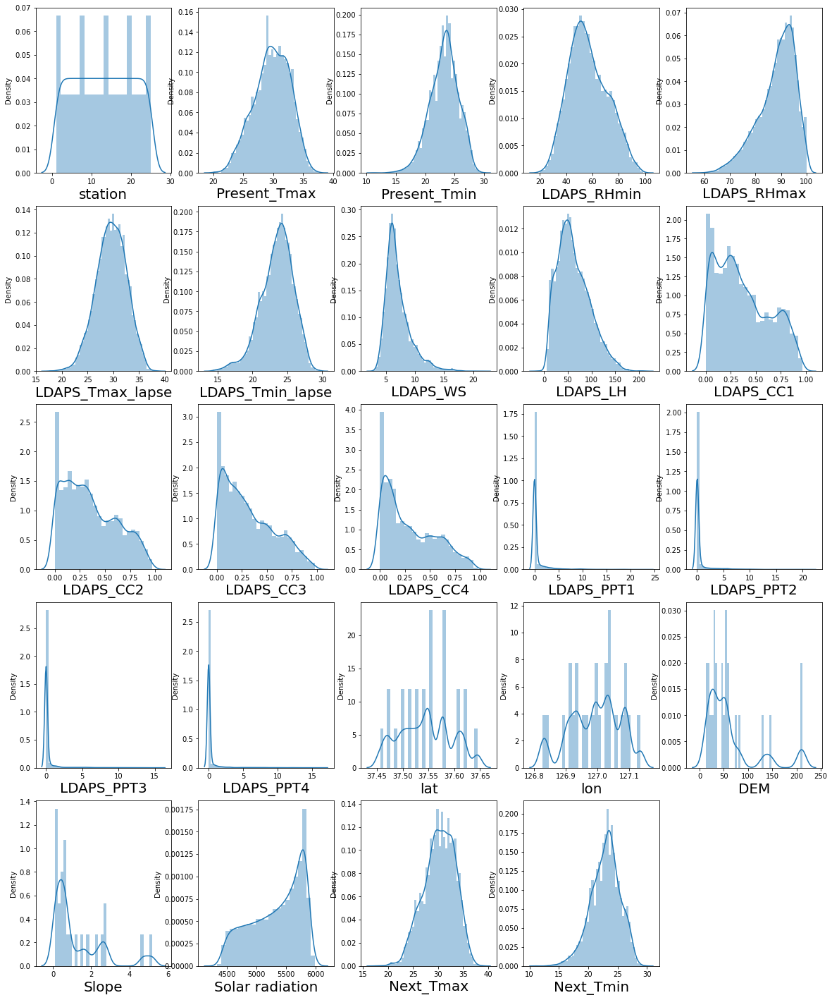

In [17]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in df.columns:
    if column!='Date':
        if plotnumber<=len(df.columns):
            ax=plt.subplot(5,5,plotnumber)
            sn.distplot(df[column])
            plt.xlabel(column,fontsize=20)
        plotnumber+=1
plt.show()

#### bimodial distribution: Slope, Dem, Ion, Iat

##### rectangular dist plot: station

#### rest all are normal distribution with some biasing present
columns having normal distribution: fill their null values using mean

In [18]:
for i in df_new.columns:
    if len(df_new[df_new[i].isnull()])>0:
        print(i)
        print('No. of Null Value:',len(df_new[df_new[i].isnull()]))
        print('Mean Value:', round(df_new[i].mean(),2))
        df_new[[i]]=df_new[[i]].fillna(round(df_new[i].mean(),2))
        print('No. of Null Value post cleaning: ',len(df_new[df_new[i].isnull()]))

Present_Tmax
No. of Null Value: 60
Mean Value: 29.77
No. of Null Value post cleaning:  0
Present_Tmin
No. of Null Value: 60
Mean Value: 23.23
No. of Null Value post cleaning:  0
LDAPS_RHmin
No. of Null Value: 75
Mean Value: 56.74
No. of Null Value post cleaning:  0
LDAPS_RHmax
No. of Null Value: 75
Mean Value: 88.37
No. of Null Value post cleaning:  0
LDAPS_Tmax_lapse
No. of Null Value: 75
Mean Value: 29.62
No. of Null Value post cleaning:  0
LDAPS_Tmin_lapse
No. of Null Value: 75
Mean Value: 23.51
No. of Null Value post cleaning:  0
LDAPS_WS
No. of Null Value: 75
Mean Value: 7.1
No. of Null Value post cleaning:  0
LDAPS_LH
No. of Null Value: 75
Mean Value: 62.46
No. of Null Value post cleaning:  0
LDAPS_CC1
No. of Null Value: 75
Mean Value: 0.37
No. of Null Value post cleaning:  0
LDAPS_CC2
No. of Null Value: 75
Mean Value: 0.36
No. of Null Value post cleaning:  0
LDAPS_CC3
No. of Null Value: 75
Mean Value: 0.32
No. of Null Value post cleaning:  0
LDAPS_CC4
No. of Null Value: 75
Mean 

In [19]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7723 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7723 non-null   float64
 1   Date              7723 non-null   int64  
 2   Present_Tmax      7723 non-null   float64
 3   Present_Tmin      7723 non-null   float64
 4   LDAPS_RHmin       7723 non-null   float64
 5   LDAPS_RHmax       7723 non-null   float64
 6   LDAPS_Tmax_lapse  7723 non-null   float64
 7   LDAPS_Tmin_lapse  7723 non-null   float64
 8   LDAPS_WS          7723 non-null   float64
 9   LDAPS_LH          7723 non-null   float64
 10  LDAPS_CC1         7723 non-null   float64
 11  LDAPS_CC2         7723 non-null   float64
 12  LDAPS_CC3         7723 non-null   float64
 13  LDAPS_CC4         7723 non-null   float64
 14  LDAPS_PPT1        7723 non-null   float64
 15  LDAPS_PPT2        7723 non-null   float64
 16  LDAPS_PPT3        7723 non-null   float64


In [20]:
df_new.describe()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,...,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000
mean,13.008157,7.466917,29.769817,23.225353,56.740762,88.371453,29.616687,23.512195,7.095405,62.458821,...,0.481582,0.275170,0.267359,37.544753,126.991373,61.913798,1.258368,5342.112868,30.275437,22.932837
std,7.214034,0.530389,2.956157,2.400841,14.571702,7.155898,2.927713,2.330885,2.165080,33.505514,...,1.736231,1.138910,1.185557,0.050370,0.079318,54.308844,1.370719,429.072274,3.123441,2.483181
min,1.000000,6.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,7.000000,7.000000,27.800000,21.700000,46.045780,84.291611,27.696327,22.114527,5.686500,37.460390,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,7.000000,29.900000,23.400000,55.266701,89.699196,29.664030,23.733589,6.564141,57.299645,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5437.534180,30.500000,23.100000
75%,19.000000,8.000000,32.000000,24.900000,66.991833,93.702629,31.684914,25.134434,7.996720,83.884903,...,0.024025,0.009648,0.000696,37.577600,127.042000,59.832400,1.767800,5728.624512,32.600000,24.600000
max,25.000000,8.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178200,5992.895996,38.900000,29.800000


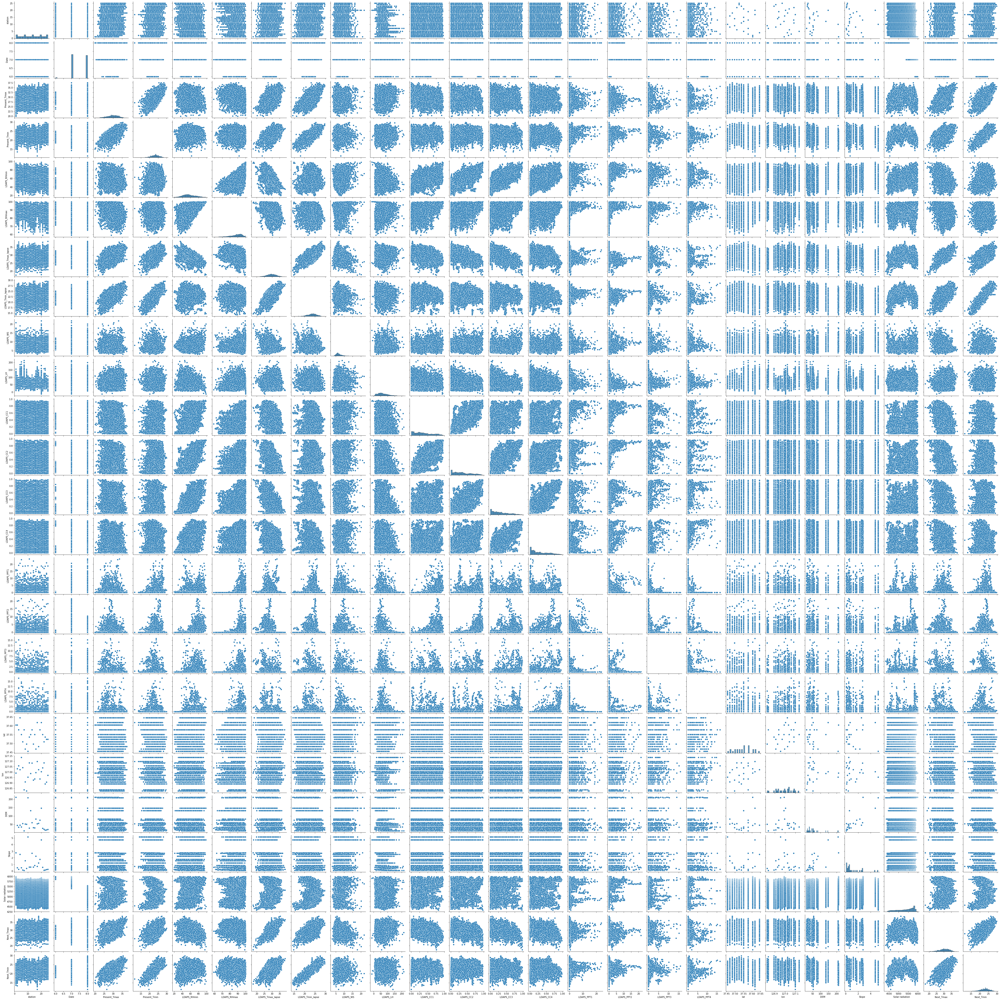

In [21]:
sn.pairplot(df_new)

###### Huge variance in Quartile range of Columns indicates presence of outliers in them

#### Correlation

In [22]:
df_new.corr()[['Next_Tmax','Next_Tmin']]

,Next_Tmax,Next_Tmin
station,0.108306,0.128719
Date,0.102792,0.033754
Present_Tmax,0.609838,0.622235
Present_Tmin,0.470229,0.796415
LDAPS_RHmin,-0.442575,0.092968
LDAPS_RHmax,-0.287557,-0.075366
LDAPS_Tmax_lapse,0.828281,0.586581
LDAPS_Tmin_lapse,0.586735,0.881333
LDAPS_WS,-0.348681,-0.100922
LDAPS_LH,0.155615,-0.058755


<AxesSubplot:>

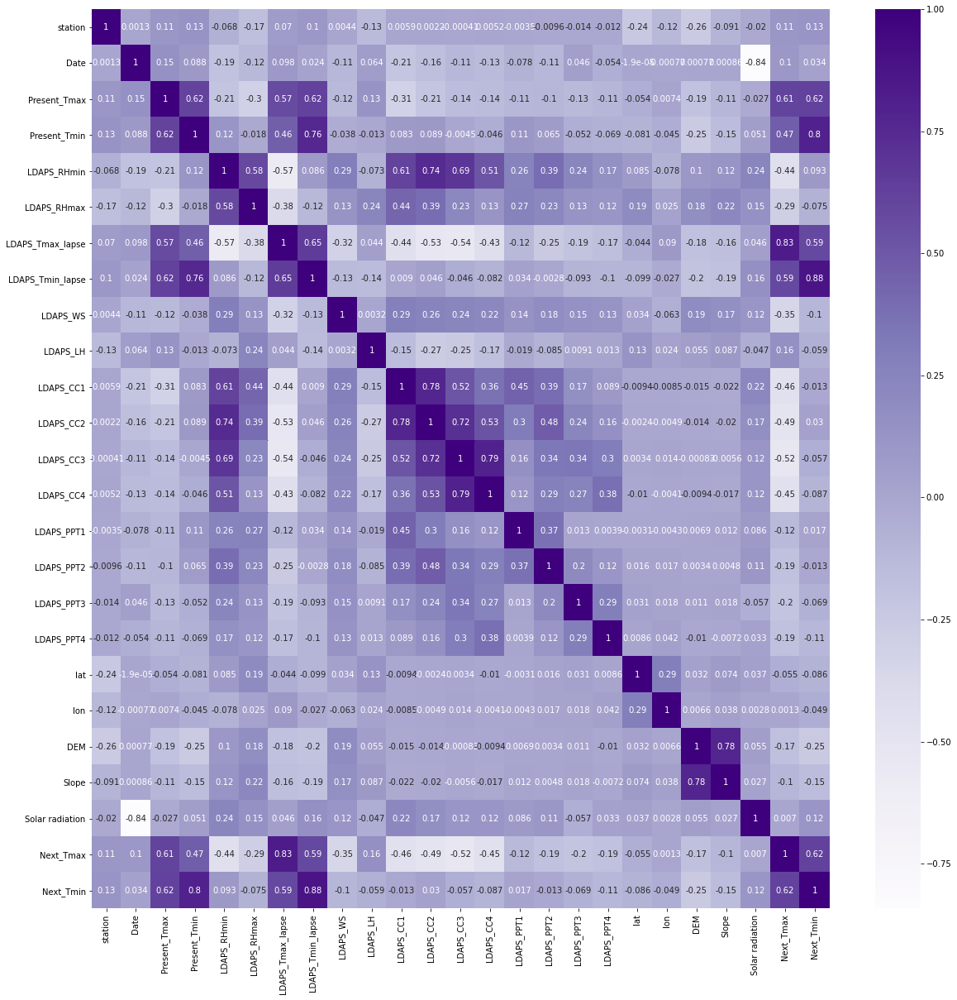

In [23]:
plt.figure(figsize=[20,20])
sn.heatmap(df_new.corr(),annot=True,cmap='Purples')

<AxesSubplot:>

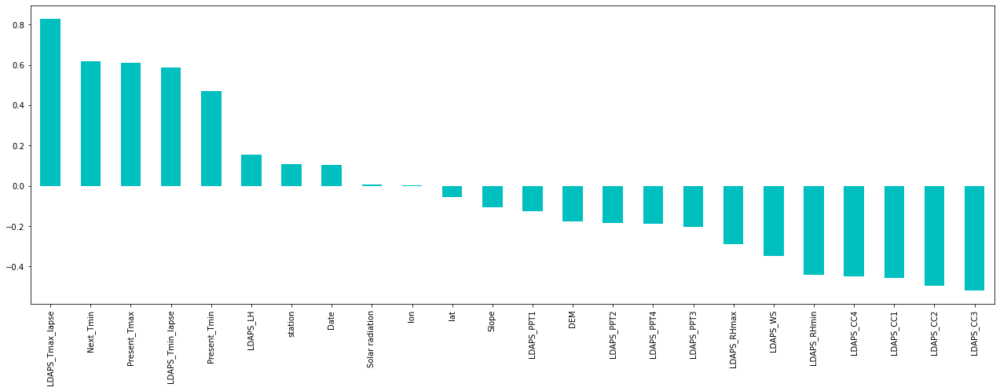

In [24]:
plt.figure(figsize=(22,7))
df_new.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='c')

<AxesSubplot:>

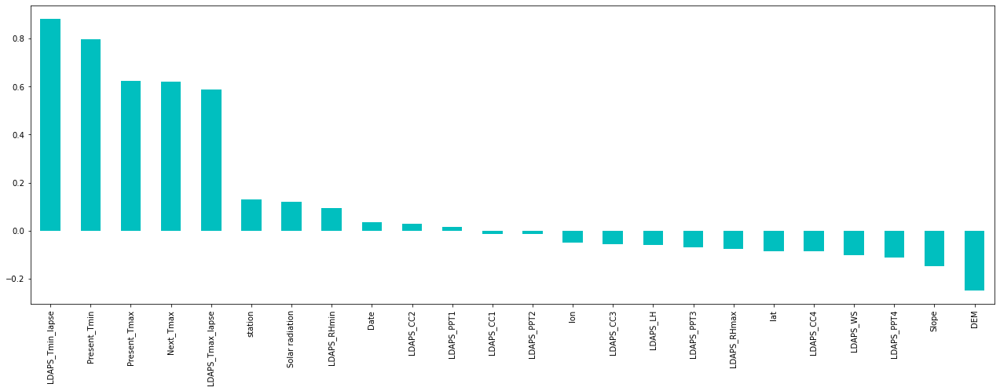

In [25]:
plt.figure(figsize=(22,7))
df_new.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='c')

#### Dropping the colums with least correlation

In [26]:
df_new=df_new.drop(['Date','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','lat','lon',
                    'DEM','Slope','Solar radiation','station'],axis=1)

In [27]:
df_new

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,0.233947,0.203896,1.616969e-01,0.130928,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,0.225508,0.251771,1.594441e-01,0.127727,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,0.209344,0.257469,2.040915e-01,0.142125,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,0.216372,0.226002,1.611574e-01,0.134249,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,0.151407,0.249995,1.788925e-01,0.170021,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,0.052902,0.030169,0.000000e+00,0.004380,27.6,17.7
7746,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,0.066461,0.024518,5.850000e-07,0.017678,28.0,17.1
7747,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,0.030034,0.081035,0.000000e+00,0.000000,28.3,18.1
7748,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,0.035874,0.074962,0.000000e+00,0.000000,28.6,18.8


##### Checking relation between target variable and rest columns

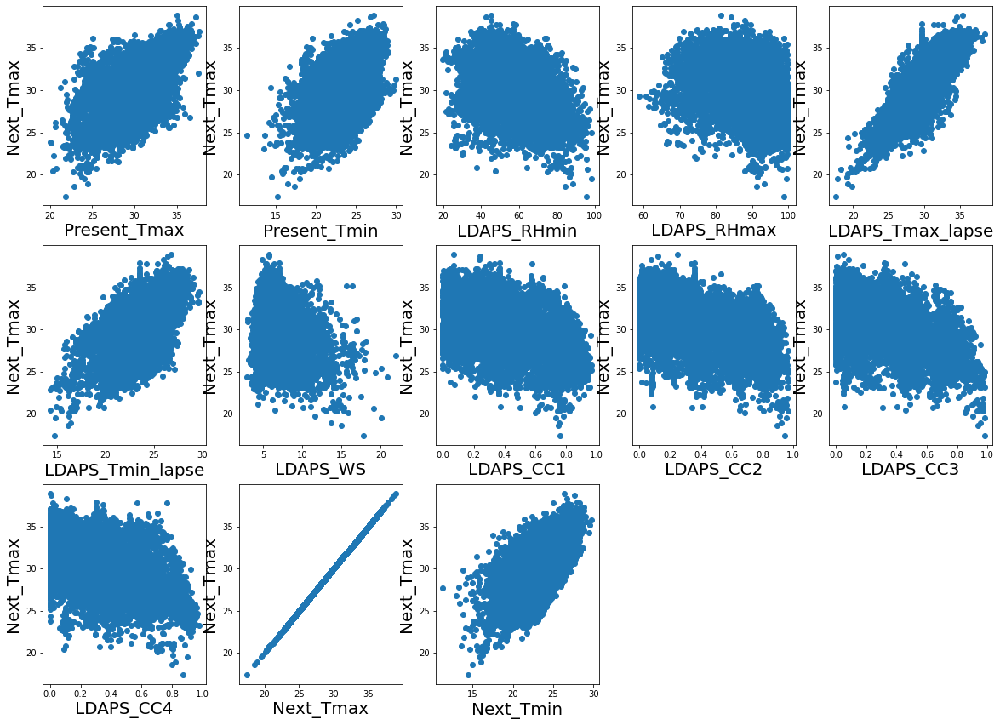

In [28]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for i in df_new.columns:
    if plotnumber<=len(df_new.columns):
        ax=plt.subplot(5,5,plotnumber)
        plt.scatter(df_new[i],df_new['Next_Tmax'])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('Next_Tmax',fontsize=20)
    plotnumber+=1
plt.show()

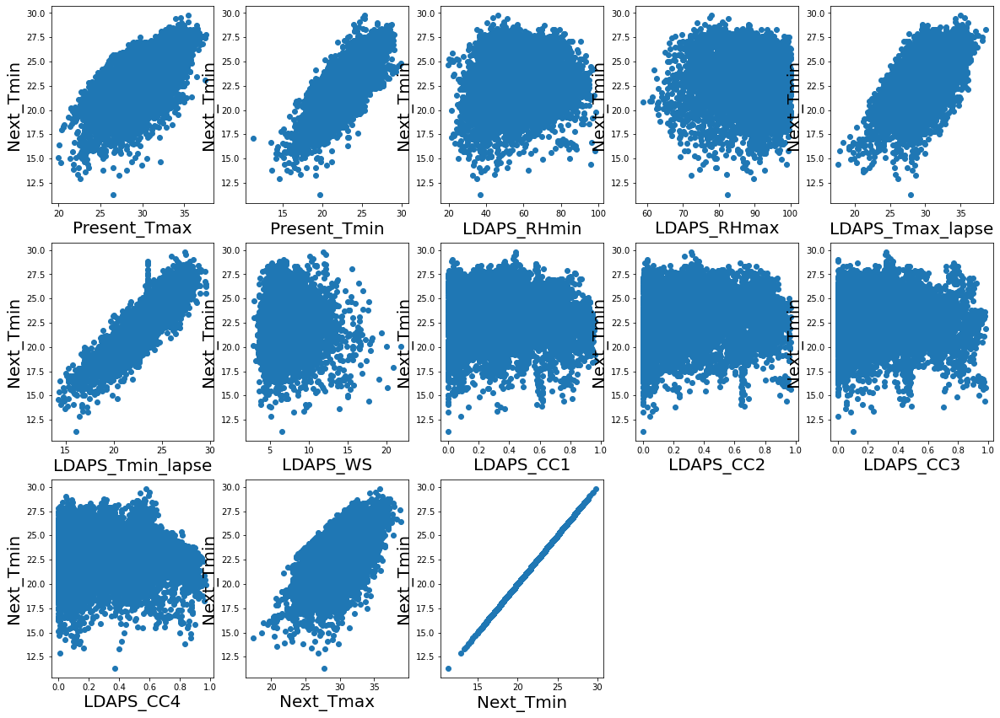

In [29]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for i in df_new.columns:
    if plotnumber<=len(df_new.columns):
        ax=plt.subplot(5,5,plotnumber)
        plt.scatter(df_new[i],df_new['Next_Tmin'])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('Next_Tmin',fontsize=20)
    plotnumber+=1
plt.show()

For both target variable
positively correlated data columns are: present tmax, present tmin, ldaps_tmin_lapse,ldaps_max_lapse
rest all are scattered datapoints with slight negative correlation

##### Ouliers Check

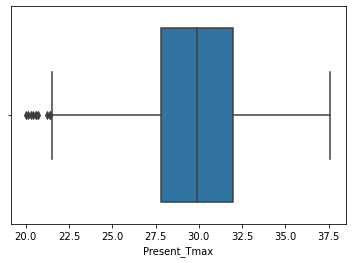

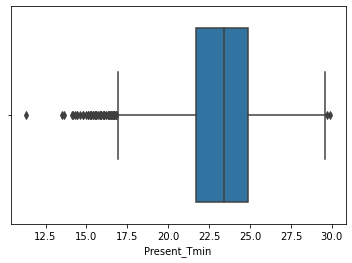

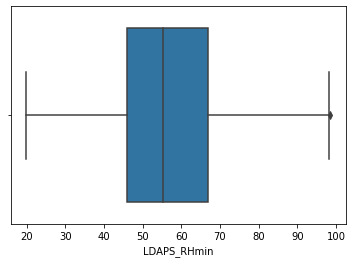

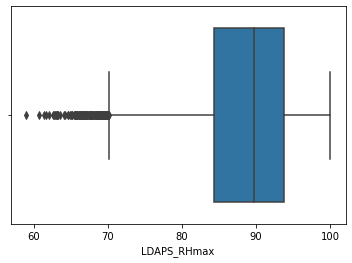

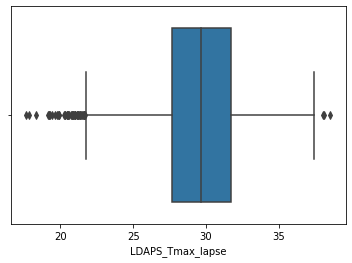

...

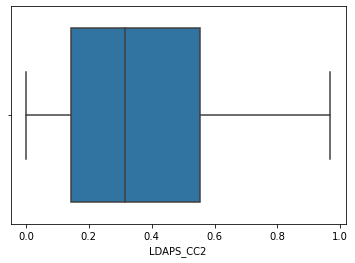

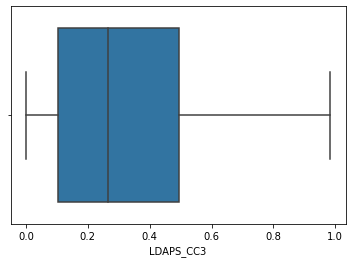

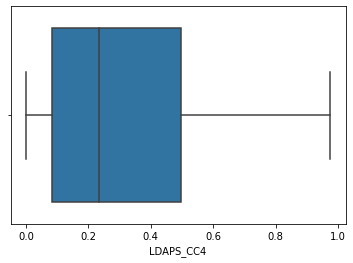

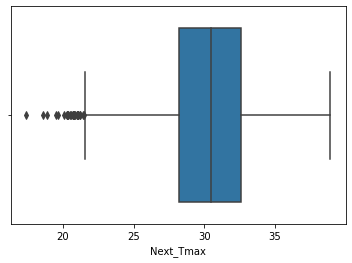

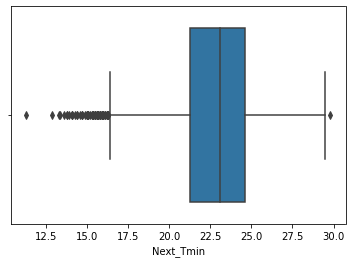

In [30]:
for i in df_new.columns:
    sn.boxplot(df_new[i])
    plt.show()

#### outliers present in some numeric columns which will be corrected by Z-score/IQR method

In [31]:
z_scr=zscore(df_new)
print(df_new.shape)
df_neww=df_new.loc[(abs(z_scr)<3).all(axis=1)]
print(df_neww.shape)

(7723, 13)
(7467, 13)


In [32]:
print ('Data Loss:',((7723-7467)/7723)*100)

Data Loss: 3.3147740515343775


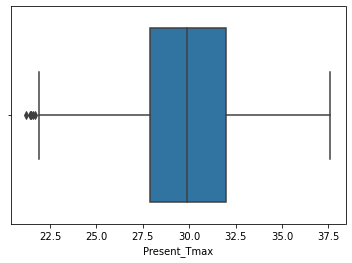

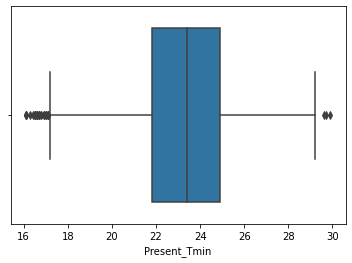

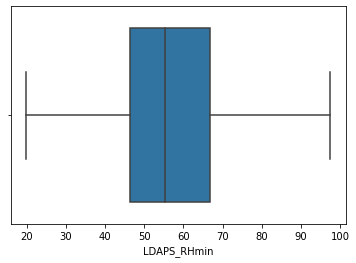

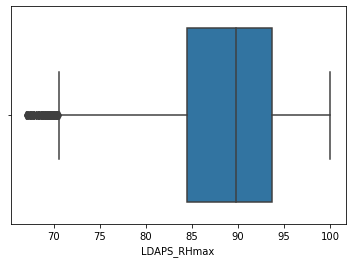

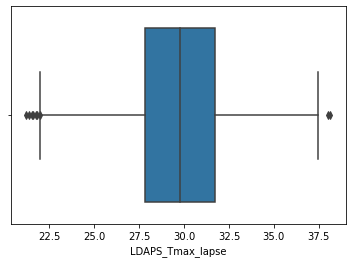

...

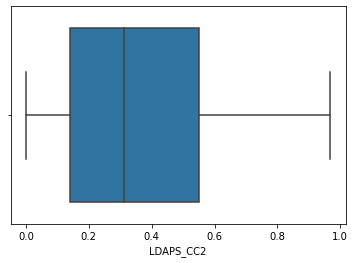

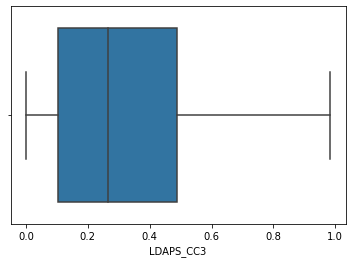

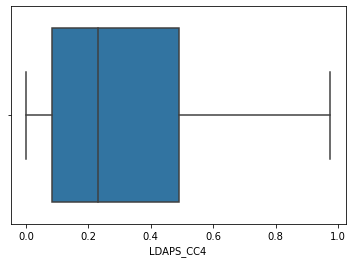

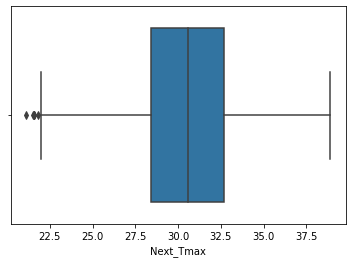

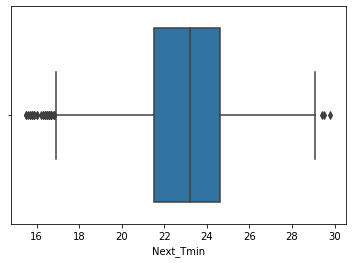

In [33]:
for i in df_neww.columns:
    sn.boxplot(df_neww[i])
    plt.show()

In [34]:
Q1 = df_neww.quantile(q=.25)
Q3 = df_neww.quantile(q=.75)
IQR = df_neww.apply(stats.iqr)

#only keep rows in dataframe that have values within 1.5*IQR of Q1 and Q3
data_clean = df_neww[~((df_neww < (Q1-1.5*IQR)) | (df_neww > (Q3+1.5*IQR))).any(axis=1)]

#find how many rows are left in the dataframe 
data_clean.shape

(6970, 13)

In [35]:
print ('Data Loss:',((7467-6970)/7467)*100)

Data Loss: 6.655952859247355


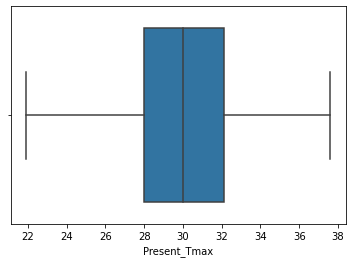

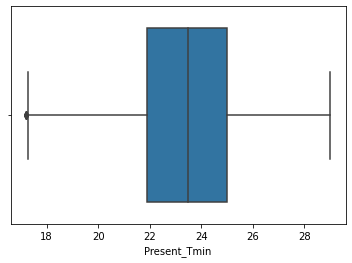

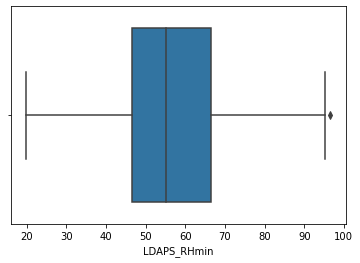

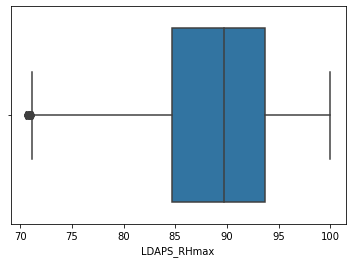

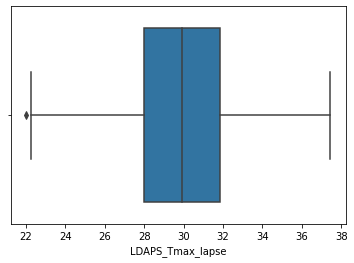

...

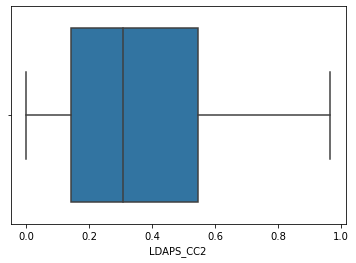

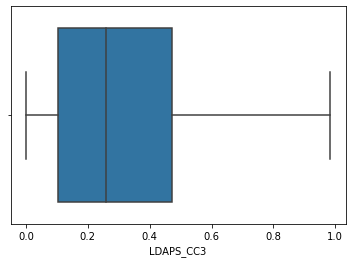

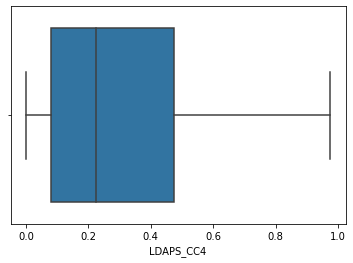

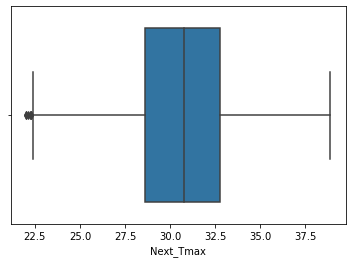

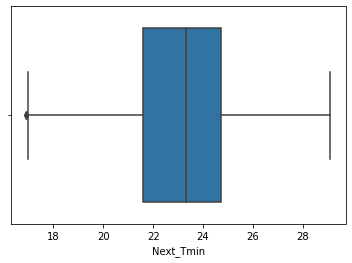

In [36]:
for i in data_clean.columns:
    sn.boxplot(data_clean[i])
    plt.show()

##### Splitting Target & Feature variable 

In [37]:
y = df_neww[['Next_Tmin','Next_Tmax']]
x = df_neww.drop(columns = ['Next_Tmin','Next_Tmax'],axis=1)

##### Skewness Check

In [38]:
print(x.skew())
print(len(x.skew().loc[x.skew()>0.55]))

Present_Tmax       -0.227070
Present_Tmin       -0.207121
LDAPS_RHmin         0.285726
LDAPS_RHmax        -0.751255
LDAPS_Tmax_lapse   -0.095534
LDAPS_Tmin_lapse   -0.363165
LDAPS_WS            1.018813
LDAPS_CC1           0.483504
LDAPS_CC2           0.474373
LDAPS_CC3           0.641673
LDAPS_CC4           0.674528
dtype: float64
3


In [39]:
for index in x.skew().index:
    if x.skew().loc[index] >0.55:
        x[index]=np.cbrt(x[index])

In [40]:
print(x.skew())
print(len(x.skew().loc[x.skew()>0.55]))# Number of features having skewness more than 0.55

Present_Tmax       -0.227070
Present_Tmin       -0.207121
LDAPS_RHmin         0.285726
LDAPS_RHmax        -0.751255
LDAPS_Tmax_lapse   -0.095534
LDAPS_Tmin_lapse   -0.363165
LDAPS_WS            0.565500
LDAPS_CC1           0.483504
LDAPS_CC2           0.474373
LDAPS_CC3          -0.573149
LDAPS_CC4          -0.460020
dtype: float64
1


##### Removed  all baising

### Feature Scaling

In [41]:
scaler = StandardScaler()
x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']] = scaler.fit_transform(x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']])
x

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4
0,-0.391487,-0.836958,0.107624,0.379471,-0.594460,-0.284678,0.013549,-0.507230,-0.587842,-0.318140,-0.359204
1,0.717344,-0.750068,-0.309875,0.305092,0.037522,0.184641,-0.663749,-0.539656,-0.400064,-0.329728,-0.377111
2,0.613391,-0.011501,-0.558810,-0.658906,0.123112,0.426873,-0.385667,-0.601765,-0.377715,-0.117694,-0.298769
3,0.751995,0.031944,0.106516,1.159743,-0.014435,-0.138943,-0.690553,-0.574760,-0.501135,-0.320905,-0.340934
4,0.544089,-0.619733,-0.037407,0.239732,-0.224562,-0.065764,-0.636266,-0.824374,-0.407030,-0.233048,-0.160893
...,...,...,...,...,...,...,...,...,...,...,...
7745,-2.331941,-2.400982,-2.231058,-1.489314,-0.687449,-2.432034,-0.109927,-1.202857,-1.269235,-2.801782,-1.836328
7746,-2.539847,-2.574762,-1.854417,-0.700129,-1.081522,-2.655253,-0.615274,-1.150760,-1.291397,-2.763654,-1.420505
7747,-2.262639,-2.705098,-2.088068,-1.400857,-1.207032,-2.216261,-0.379172,-1.290722,-1.069727,-2.801782,-2.538543
7748,-2.262639,-2.444427,-2.276231,-1.629805,-0.972922,-2.235507,-0.145014,-1.268285,-1.093546,-2.801782,-2.538543


#### Multicolinearity Check

In [42]:
vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1]) ]
vif["Features"] = x.columns
vif

,vif,Features
0,2.366636,Present_Tmax
1,2.733514,Present_Tmin
2,5.542553,LDAPS_RHmin
3,1.961899,LDAPS_RHmax
4,6.070727,LDAPS_Tmax_lapse
5,5.731238,LDAPS_Tmin_lapse
6,1.132871,LDAPS_WS
7,3.012618,LDAPS_CC1
8,4.489043,LDAPS_CC2
9,3.741361,LDAPS_CC3


#### Multicollinearity only affects the coefficients and p-values, but it does not influence the model’s ability to predict the dependent variable.

#### PCA for Dimension Reduction

In [43]:
for i in range(2,12):
    pca = PCA(n_components=i)
    principalComponents = pca.fit_transform(x)
    print(i,sum(pca.explained_variance_ratio_))

2 0.6295259247446674
3 0.7358595263190926
4 0.8196658622751983
5 0.8727265186304075
6 0.9102027787317294
7 0.9383043833033203
8 0.9631745296586162
9 0.9797842526000814
10 0.9932599524923733
11 1.0000000000000002


#### Chosed 8 columns as they are able to retain more than 95% data

In [44]:
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(x)

##### Best Random State

In [45]:
def besttrain(model,x,y):
    random=0
    score=0
    for i in range(42,200):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state = i,test_size=0.20,shuffle=True)
        model.fit(x_train,y_train)
        tmp=r2_score(y_test,model.predict(x_test))
        if tmp>score:
            score=tmp
            random=i
    return random

### Model Building & Evaluation

In [46]:
models=[LinearRegression(),Ridge(),RidgeCV(),KNeighborsRegressor(),RandomForestRegressor(),BaggingRegressor(),
       DecisionTreeRegressor()]

#### These are only models valid for polynimial regression

In [47]:
for i in models:
    x_train,x_test,y_train,y_test=train_test_split(principalComponents,y,random_state = 42,test_size=0.20)
    scores=cross_val_score(i,x_train,y_train,cv=5,scoring='r2')
    score=np.mean(scores)
    i.fit(x_train,y_train)
    y_pred=i.predict(x_test)
    if r2_score(y_test,y_pred)>score:
        diff=r2_score(y_test,y_pred)-score
    else:
        diff=score-r2_score(y_test,y_pred)
    print('*'*10)
    print(i)
    print('score',score)
    print('r2',r2_score(y_test,y_pred))
    print('diff',diff)
    print('mae',mean_absolute_error(y_test, y_pred))
    print('rmse',np.sqrt(mean_squared_error(y_test, y_pred)))

**********
LinearRegression()
score 0.7554510500720203
r2 0.7606073016721107
diff 0.005156251600090367
mae 1.037529831409664
rmse 1.3718761528361396
**********
Ridge()
score 0.7554514049411803
r2 0.7606043187586072
diff 0.005152913817426885
mae 1.0375431845029277
rmse 1.37188354606376
**********
RidgeCV(alphas=array([ 0.1,  1. , 10. ]))
score 0.7554534071020773
r2 0.7605768630621739
diff 0.005123455960096557
mae 1.0376649452134716
rmse 1.3719516510778527
**********
KNeighborsRegressor()
score 0.8861742938661031
r2 0.8918430675537379
diff 0.005668773687634743
mae 0.6609839357429709
rmse 0.902078590330428
**********
RandomForestRegressor()
score 0.863471661964464
r2 0.8734526390246358
diff 0.009980977060171758
mae 0.7260316655510934
rmse 0.9893764943544063
**********
BaggingRegressor()
score 0.8457894093885852
r2 0.8585789106954508
diff 0.012789501306865625
mae 0.7701336456938859
rmse 1.0459364843680252
**********
DecisionTreeRegressor()
score 0.7003567819426342
r2 0.7282165703187351
dif

#### KNeighborsRegressor is best model against all evaluation metrics i.e less MAE,MSE

In [48]:
parameters={'n_neighbors':[5,6,7,8,9,10],
            'weights':['uniform', 'distance'],
            'algorithm':['auto', 'ball_tree','kd_tree','brute'],
           'leaf_size':[1,2,3,5],
            'metric' : ['minkowski','euclidean','manhattan'],}
clf = RandomizedSearchCV(KNeighborsRegressor(), parameters, cv=20,scoring="r2",verbose=1,n_jobs=-1)
clf.fit(principalComponents,y)
clf.best_params_            

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    4.4s finished


{'weights': 'distance',
 'n_neighbors': 10,
 'metric': 'euclidean',
 'leaf_size': 2,
 'algorithm': 'brute'}

#### Finding Best Random state

In [50]:
besttrain(KNeighborsRegressor(n_neighbors=10,weights='distance',algorithm='brute',leaf_size=2,metric='euclidean'),principalComponents,y)

65

In [51]:
x_train,x_test,y_train,y_test=train_test_split(principalComponents, y,random_state = 65,test_size=0.20,shuffle=True)
model=KNeighborsRegressor(n_neighbors=10,weights='distance',algorithm='brute',leaf_size=2,metric='euclidean')
model.fit(x_train,y_train)
y_pred=model.predict(x_test)

In [52]:
pred = model.predict(x_test)
score = r2_score(y_test, pred)
print('r2 score test',score)
pred = model.predict(x_train)
score = r2_score(y_train, pred)
print('r2 score train',score)

r2 score test 0.903916744354243
r2 score train 1.0


In [53]:
y_pred=model.predict(x_test)
score=r2_score(y_test,y_pred)
print('coeff of determination is:',score)
print('mean absolute error:',mean_absolute_error(y_test,y_pred))
print('mean squared error:',mean_squared_error(y_test,y_pred))
print('root mean square error:',np.sqrt(mean_squared_error(y_test,y_pred)))
scores =cross_val_score(KNeighborsRegressor(n_neighbors=9,weights='distance',algorithm='brute',leaf_size=3,metric='minkowski'),principalComponents,y,cv=5,n_jobs=-1,verbose=1)
print('cross val score',scores.mean())
print('std err',scores.std())

coeff of determination is: 0.903916744354243
mean absolute error: 0.6433309674880027
mean squared error: 0.7501399595969808
root mean square error: 0.866106205725938


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


cross val score 0.6016868653083411
std err 0.07844054015174026


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.2s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished


In [54]:
y_pred=model.predict(principalComponents)
score=r2_score(y,y_pred)
print('coeff of determination is:',score)
print('mean absolute error:',mean_absolute_error(y,y_pred))
print('mean squared error:',mean_squared_error(y,y_pred))
print('root mean square error:',np.sqrt(mean_squared_error(y,y_pred)))

coeff of determination is: 0.9794697971145921
mean absolute error: 0.12899250446296356
mean squared error: 0.1503919378114781
root mean square error: 0.3878039940633388


#### fill the missing values of target variables

In [55]:
dfpred=df[df.Next_Tmin.isnull()][df.Next_Tmax.isnull()]
dfpred

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
831,7.0,8,29.6,25.8,76.202255,94.058517,28.842727,26.442801,7.980686,87.715882,...,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5357.705566,NaN,NaN
856,7.0,8,NaN,NaN,69.476059,93.672600,30.491629,25.081388,6.282423,124.191446,...,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5332.515625,NaN,NaN
1073,24.0,8,34.2,25.1,50.618851,89.166397,33.414349,27.475249,6.084058,48.521008,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.2223,5109.454102,NaN,NaN
2465,16.0,8,28.8,23.1,71.442566,90.695419,26.273760,23.419080,3.787889,41.739802,...,0.010050,0.681801,0.000000,37.4697,126.995,82.2912,2.2579,5269.604980,NaN,NaN
3696,22.0,7,30.4,23.4,81.568771,93.973579,26.724457,24.984435,5.779299,58.456456,...,0.711069,0.016985,0.064332,37.5102,127.086,21.9668,0.1332,5578.788086,NaN,NaN
3714,15.0,7,24.6,22.4,83.265244,94.153442,26.738321,24.585545,8.048991,43.391457,...,0.803824,0.190226,0.001864,37.5507,126.937,30.0464,0.8552,5578.187500,NaN,NaN
3739,15.0,7,NaN,NaN,68.156593,93.874550,28.502294,24.270829,5.819343,35.236471,...,1.128825,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5558.664551,NaN,NaN
3886,12.0,7,NaN,NaN,64.559479,86.083702,29.628166,25.745189,8.629767,26.564901,...,0.020635,0.001050,0.000000,37.5507,126.988,132.1180,0.5931,5477.556152,NaN,NaN
4205,6.0,8,30.8,23.9,35.218002,82.458534,32.241880,23.018172,6.547084,63.516243,...,0.000000,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5069.704102,NaN,NaN
4230,6.0,8,NaN,NaN,43.412582,84.317780,32.028639,24.274533,5.880758,54.278856,...,0.000000,0.007733,0.000000,37.5102,127.042,54.6384,0.1457,5037.928223,NaN,NaN


##### Fill the null values with mean score obtained before

In [56]:
dfpred[['Present_Tmax']]=dfpred[['Present_Tmax']].fillna(29.77)
dfpred[['Present_Tmin']]=dfpred[['Present_Tmin']].fillna(23.23)

In [57]:
dfpred.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27 entries, 831 to 7682
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           27 non-null     float64
 1   Date              27 non-null     int64  
 2   Present_Tmax      27 non-null     float64
 3   Present_Tmin      27 non-null     float64
 4   LDAPS_RHmin       27 non-null     float64
 5   LDAPS_RHmax       27 non-null     float64
 6   LDAPS_Tmax_lapse  27 non-null     float64
 7   LDAPS_Tmin_lapse  27 non-null     float64
 8   LDAPS_WS          27 non-null     float64
 9   LDAPS_LH          27 non-null     float64
 10  LDAPS_CC1         27 non-null     float64
 11  LDAPS_CC2         27 non-null     float64
 12  LDAPS_CC3         27 non-null     float64
 13  LDAPS_CC4         27 non-null     float64
 14  LDAPS_PPT1        27 non-null     float64
 15  LDAPS_PPT2        27 non-null     float64
 16  LDAPS_PPT3        27 non-null     float64


In [58]:
dfpred=dfpred.drop(['Date','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','lat','lon',
                    'DEM','Slope','Solar radiation','station'],axis=1)

In [59]:
x = dfpred.drop(columns = ['Next_Tmin','Next_Tmax'],axis=1)
for index in x.skew().index:
    if x.skew().loc[index] >0.55:
        x[index]=np.cbrt(x[index])
scaler = StandardScaler()
x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']] = scaler.fit_transform(x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']])
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(x)
y_pred=model.predict(principalComponents)

In [60]:
dfpred=df[df.Next_Tmin.isnull()][df.Next_Tmax.isnull()]
dfpred[['Present_Tmax']]=dfpred[['Present_Tmax']].fillna(29.77)
dfpred[['Present_Tmin']]=dfpred[['Present_Tmin']].fillna(23.23)
dfpred=dfpred.drop(['Next_Tmin','Next_Tmax'],axis=1)
dfpred

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
831,7.0,8,29.60,25.80,76.202255,94.058517,28.842727,26.442801,7.980686,87.715882,...,0.227664,0.086539,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5357.705566
856,7.0,8,29.77,23.23,69.476059,93.672600,30.491629,25.081388,6.282423,124.191446,...,0.173785,0.004247,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5332.515625
1073,24.0,8,34.20,25.10,50.618851,89.166397,33.414349,27.475249,6.084058,48.521008,...,0.013130,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.2223,5109.454102
2465,16.0,8,28.80,23.10,71.442566,90.695419,26.273760,23.419080,3.787889,41.739802,...,0.751662,0.000000,0.010050,0.681801,0.000000,37.4697,126.995,82.2912,2.2579,5269.604980
3696,22.0,7,30.40,23.40,81.568771,93.973579,26.724457,24.984435,5.779299,58.456456,...,0.659948,0.794114,0.711069,0.016985,0.064332,37.5102,127.086,21.9668,0.1332,5578.788086
3714,15.0,7,24.60,22.40,83.265244,94.153442,26.738321,24.585545,8.048991,43.391457,...,0.583959,0.345704,0.803824,0.190226,0.001864,37.5507,126.937,30.0464,0.8552,5578.187500
3739,15.0,7,29.77,23.23,68.156593,93.874550,28.502294,24.270829,5.819343,35.236471,...,0.064232,0.228036,1.128825,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5558.664551
3886,12.0,7,29.77,23.23,64.559479,86.083702,29.628166,25.745189,8.629767,26.564901,...,0.235075,0.003733,0.020635,0.001050,0.000000,37.5507,126.988,132.1180,0.5931,5477.556152
4205,6.0,8,30.80,23.90,35.218002,82.458534,32.241880,23.018172,6.547084,63.516243,...,0.036830,0.000000,0.000000,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5069.704102
4230,6.0,8,29.77,23.23,43.412582,84.317780,32.028639,24.274533,5.880758,54.278856,...,0.130072,0.000000,0.000000,0.007733,0.000000,37.5102,127.042,54.6384,0.1457,5037.928223


In [61]:
dfpred[['Next_Tmin','Next_Tmax']]=y_pred

In [62]:
dfpred

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Next_Tmax
831,7.0,8,29.60,25.80,76.202255,94.058517,28.842727,26.442801,7.980686,87.715882,...,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5357.705566,23.714155,26.769679
856,7.0,8,29.77,23.23,69.476059,93.672600,30.491629,25.081388,6.282423,124.191446,...,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5332.515625,23.657815,32.047711
1073,24.0,8,34.20,25.10,50.618851,89.166397,33.414349,27.475249,6.084058,48.521008,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.2223,5109.454102,26.540278,35.346299
2465,16.0,8,28.80,23.10,71.442566,90.695419,26.273760,23.419080,3.787889,41.739802,...,0.010050,0.681801,0.000000,37.4697,126.995,82.2912,2.2579,5269.604980,24.276811,31.860708
3696,22.0,7,30.40,23.40,81.568771,93.973579,26.724457,24.984435,5.779299,58.456456,...,0.711069,0.016985,0.064332,37.5102,127.086,21.9668,0.1332,5578.788086,24.088197,29.681237
3714,15.0,7,24.60,22.40,83.265244,94.153442,26.738321,24.585545,8.048991,43.391457,...,0.803824,0.190226,0.001864,37.5507,126.937,30.0464,0.8552,5578.187500,21.669863,25.836493
3739,15.0,7,29.77,23.23,68.156593,93.874550,28.502294,24.270829,5.819343,35.236471,...,1.128825,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5558.664551,22.639356,29.077386
3886,12.0,7,29.77,23.23,64.559479,86.083702,29.628166,25.745189,8.629767,26.564901,...,0.020635,0.001050,0.000000,37.5507,126.988,132.1180,0.5931,5477.556152,24.357885,30.685794
4205,6.0,8,30.80,23.90,35.218002,82.458534,32.241880,23.018172,6.547084,63.516243,...,0.000000,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5069.704102,22.574017,31.960142
4230,6.0,8,29.77,23.23,43.412582,84.317780,32.028639,24.274533,5.880758,54.278856,...,0.000000,0.007733,0.000000,37.5102,127.042,54.6384,0.1457,5037.928223,22.887468,32.662756


##### Make change in orignal dataset

In [63]:
df=pd.read_csv('temperature.csv')
df=df[df.Date.notnull()]

In [64]:
for i in list(dfpred.index):
    df['Next_Tmin'][i]=dfpred['Next_Tmin'][i]
    df['Next_Tmax'][i]=dfpred['Next_Tmax'][i]

In [65]:
dicty={'Present_Tmax':29.77,'Present_Tmin':23.23,'LDAPS_RHmin':56.74,'LDAPS_RHmax':88.37,'LDAPS_Tmax_lapse':29.62,
       'LDAPS_Tmin_lapse':23.51,'LDAPS_WS':7.1,'LDAPS_LH':62.46,'LDAPS_CC1':0.37,'LDAPS_CC2':0.36,'LDAPS_CC3':0.32,
       'LDAPS_CC4':0.3,'LDAPS_PPT1':0.59,'LDAPS_PPT2':0.48,'LDAPS_PPT3':0.28,'LDAPS_PPT4':0.27}
for key,values in dicty.items():
    df[[key]]=df[[key]].fillna(values)

In [67]:
pro=df.drop(['Date','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','lat','lon',
                    'DEM','Slope','Solar radiation'],axis=1)
x = pro.drop(columns = ['Next_Tmin','Next_Tmax'],axis=1)
for index in x.skew().index:
    if x.skew().loc[index] >0.55:
        x[index]=np.cbrt(x[index])
scaler = StandardScaler()
x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']] = scaler.fit_transform(x[['Present_Tmax','Present_Tmin','LDAPS_RHmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4']])
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(x)
y_pred=model.predict(principalComponents)

In [68]:
df[['Next_Tminp','Next_Tmaxp']]=y_pred

In [69]:
df['Next_Tmind']=df['Next_Tmin']-df['Next_Tminp']
df['Next_Tmaxd']=df['Next_Tmax']-df['Next_Tmaxp']
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Next_Tminp,Next_Tmaxp,Next_Tmind,Next_Tmaxd
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,126.991,212.3350,2.7850,5992.895996,29.1,21.2,21.443033,24.846563,-0.243033,4.253437
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,127.032,44.7624,0.5141,5869.312500,30.5,22.5,21.330656,24.593921,1.169344,5.906079
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,127.058,33.3068,0.2661,5863.555664,31.1,23.9,22.251217,24.410636,1.648783,6.689364
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,127.022,45.7160,2.5348,5856.964844,31.7,24.3,21.584824,24.587206,2.715176,7.112794
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,127.135,35.0380,0.5055,5859.552246,31.2,22.5,22.006373,24.299510,0.493627,6.900490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,30-08-2017,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,127.040,26.2980,0.5721,4456.024414,27.6,17.7,26.951705,35.461430,-9.251705,-7.861430
7746,22.0,30-08-2017,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,127.086,21.9668,0.1332,4441.803711,28.0,17.1,26.608133,35.465704,-9.508133,-7.465704
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,126.891,15.5876,0.1554,4443.313965,28.3,18.1,26.952921,35.463345,-8.852921,-7.163345
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,126.909,17.2956,0.2223,4438.373535,28.6,18.8,27.090002,35.308152,-8.290002,-6.708152


###### plot Regression plot to check actual vs pred value

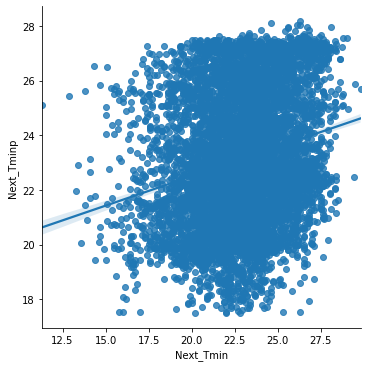

In [70]:
sn.lmplot(x='Next_Tmin',y='Next_Tminp',data=df,palette='rainbow')

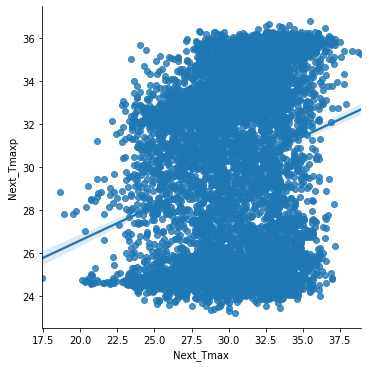

In [71]:
sn.lmplot(x='Next_Tmax',y='Next_Tmaxp',data=df,palette='rainbow')

##### Saving the best model

In [72]:
joblib.dump(model,'Temp.pkl')

['Temp.pkl']